In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display

class BacteriaSimulator:
    """
    A class to simulate bacteria and food distribution and dynamics on a 2D grid.

    Attributes:
        grid_size (int): The size of the grid (NxN).
        food_growth_rate (float): Rate at which food grows.
        bacteria_consumption_rate (float): Rate at which bacteria consume food.
        food_diffusion_rate (float): Rate at which food diffuses across the grid.
        bacteria_diffusion_rate (float): Rate at which bacteria diffuse across the grid.
        bacteria_growth_rate (float): Rate at which bacteria grow.
        food_capacity (int): Maximum amount of food per grid cell.
        grid (np.array): The grid storing food and bacteria densities.
        figure (matplotlib.figure.Figure): The figure object for plotting.
        axes (np.array): Array of axes objects for plotting.
        food_plot (matplotlib.image.AxesImage): Plot showing food distribution.
        bacteria_plot (matplotlib.image.AxesImage): Plot showing bacteria distribution.
        average_food_data (list of float): A list to record the average amount of food per cell.
        average_bacteria_data (list of float): A list to record the average bacteria count per cell.
    """

    def __init__(self, grid_size, food_growth_rate, bacteria_consumption_rate, 
                 food_diffusion_rate, bacteria_diffusion_rate, bacteria_growth_rate):
        #Initialize the Bacteria Simulator with given parameters
        self.grid_size = grid_size
        self.food_growth_rate = food_growth_rate
        self.bacteria_consumption_rate = bacteria_consumption_rate
        self.food_diffusion_rate = food_diffusion_rate
        self.bacteria_diffusion_rate = bacteria_diffusion_rate
        self.bacteria_growth_rate = bacteria_growth_rate
        self.food_capacity = 100  # Maximum food per cell
        self.grid = None
        self.figure, self.axes = plt.subplots(1, 2, figsize=(10, 5))
        self.food_plot = None
        self.bacteria_plot = None
        self.average_food_data = []
        self.average_bacteria_data = []
        
    def initialize(self):
        
        """
        Sets up the simulation with initial random food and bacteria distribution and initializes the plots.
        """
    
        self.grid = np.zeros((self.grid_size, self.grid_size, 2))  # [food, bacteria]
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                self.grid[i, j, 0] = np.random.rand() * self.food_capacity
                self.grid[i, j, 1] = np.random.rand() * self.food_capacity
        self.food_plot = self.axes[0].imshow(self.grid[:, :, 0], cmap='viridis')
        self.bacteria_plot = self.axes[1].imshow(self.grid[:, :, 1], vmin=0, vmax=200, cmap='viridis')
        self.axes[0].set_title('Food Distribution')
        self.axes[1].set_title('Bacteria Distribution')
        self.figure.colorbar(self.food_plot, ax=self.axes[0], fraction=0.046, pad=0.04)
        self.figure.colorbar(self.bacteria_plot, ax=self.axes[1], fraction=0.046, pad=0.04)
        
        
    def update(self):
        
        """
        Executes one simulation step, updating food and bacteria distributions according to the model rules.
        """
    
        new_grid = np.copy(self.grid)
        # Food Growth
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                food = self.grid[i, j, 0]
                food_growth = self.food_growth_rate * food * (1 - food / self.food_capacity)
                new_grid[i, j, 0] = min(food + food_growth, self.food_capacity)

        # Food Reseeding
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                if np.random.rand() < 0.01:
                    new_grid[i, j, 0] = min(new_grid[i, j, 0] + 1, self.food_capacity)

        # Food Diffusion
        food_diffusion_changes = np.zeros_like(self.grid[:, :, 0])
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                food = new_grid[i, j, 0]
                diffusion_amount = self.food_diffusion_rate * food
                for di, dj in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
                    ni, nj = (i + di) % self.grid_size, (j + dj) % self.grid_size
                    food_diffusion_changes[ni, nj] += diffusion_amount / 4
                food_diffusion_changes[i, j] -= diffusion_amount
        new_grid[:, :, 0] += food_diffusion_changes

        # Bacteria Consumption and Reproduction
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                bacteria = self.grid[i, j, 1]
                food = new_grid[i, j, 0]
                if food >= bacteria * self.bacteria_consumption_rate:
                    # Enough food for all bacteria
                    new_grid[i, j, 0] -= bacteria * self.bacteria_consumption_rate
                    new_grid[i, j, 1] *= (1 + self.bacteria_growth_rate)  # Bacteria reproduce
                else:
                    # Not enough food, bacteria starve
                    new_grid[i, j, 1] = (food / self.bacteria_consumption_rate) * (1 + self.bacteria_growth_rate)
                    new_grid[i, j, 0] = 0

        # Bacteria Diffusion
        bacteria_diffusion_changes = np.zeros_like(self.grid[:, :, 0])
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                bacteria = new_grid[i, j, 1]
                diffusion_amount = self.bacteria_diffusion_rate * bacteria
                for di, dj in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
                    ni, nj = (i + di) % self.grid_size, (j + dj) % self.grid_size
                    bacteria_diffusion_changes[ni, nj] += diffusion_amount / 4
                bacteria_diffusion_changes[i, j] -= diffusion_amount
        new_grid[:, :, 1] += bacteria_diffusion_changes
                
        # Calculate and store the averages
        self.grid = new_grid
        avg_food = np.mean(self.grid[:, :, 0])
        avg_bacteria = np.mean(self.grid[:, :, 1])
        self.average_food_data.append(avg_food)
        self.average_bacteria_data.append(avg_bacteria)
        
def animate(i):
    """
    Animation function that updates the plots for each frame.
    
    Args:
        i (int): The current frame index.
        
    Returns:
        2 plots: Returns the updated food and bacteria plots.
    """
    sim.update()
    sim.food_plot.set_data(sim.grid[:, :, 0])
    sim.bacteria_plot.set_data(sim.grid[:, :, 1])
    return sim.food_plot, sim.bacteria_plot

#Plotting averages
def plot_averages(sim):
    plt.figure(figsize=(14, 7))
    plt.plot(sim.average_food_data, label='Average Food per Cell', color='green')
    plt.plot(sim.average_bacteria_data, label='Average Bacteria per Cell', color='blue')
    plt.xlabel('Time step')
    plt.ylabel('Average population per cell')
    plt.title('Average Food and Bacteria Population Over Time')
    plt.legend()
    plt.show()

In [2]:
#Running a simulation
sim = BacteriaSimulator(grid_size=100, food_growth_rate=0.05, bacteria_consumption_rate=0.02, 
                            food_diffusion_rate=0.1, bacteria_diffusion_rate=0.1, bacteria_growth_rate=0.02)
sim.initialize()
anim = FuncAnimation(sim.figure, animate, frames=300, interval=50, blit=True)
plt.close('all')
display(HTML(anim.to_html5_video()))

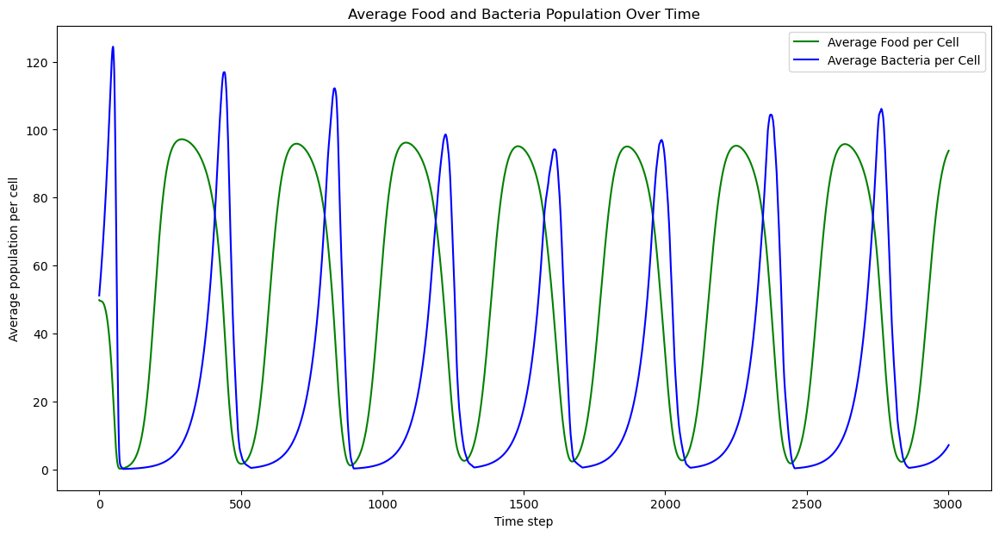

In [6]:
plot_averages(sim)

In [7]:
#Running a simulation
sim = BacteriaSimulator(grid_size=100, food_growth_rate=0.05, bacteria_consumption_rate=0.1, 
                            food_diffusion_rate=0.1, bacteria_diffusion_rate=0.1, bacteria_growth_rate=0.02)
sim.initialize()
anim = FuncAnimation(sim.figure, animate, frames=3000, interval=50, blit=True)
plt.close('all')
display(HTML(anim.to_html5_video()))

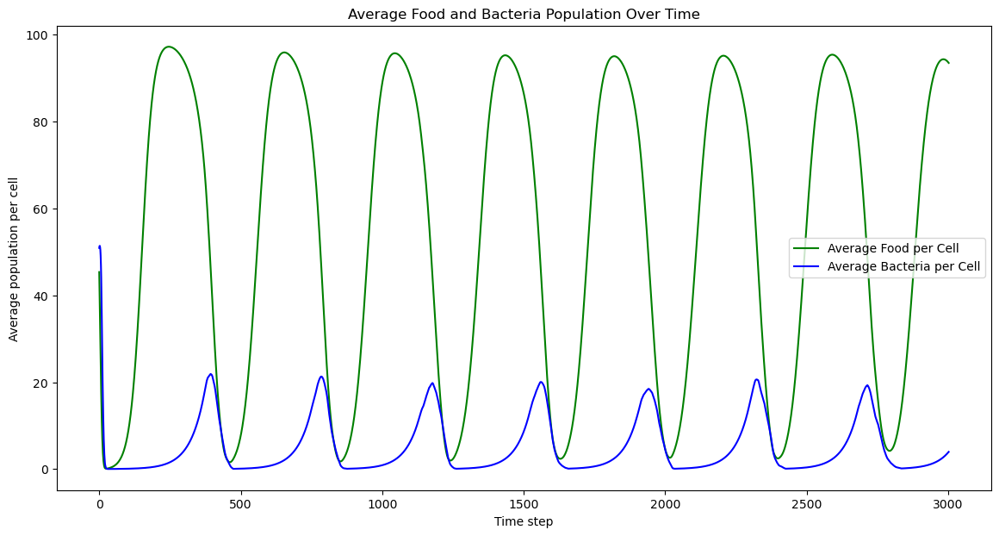

In [8]:
plot_averages(sim)

In [9]:
#Running a simulation
sim = BacteriaSimulator(grid_size=100, food_growth_rate=0.01, bacteria_consumption_rate=0.02, 
                            food_diffusion_rate=0.2, bacteria_diffusion_rate=0.1, bacteria_growth_rate=0.02)
sim.initialize()
anim = FuncAnimation(sim.figure, animate, frames=3000, interval=50, blit=True)
plt.close('all')
display(HTML(anim.to_html5_video()))

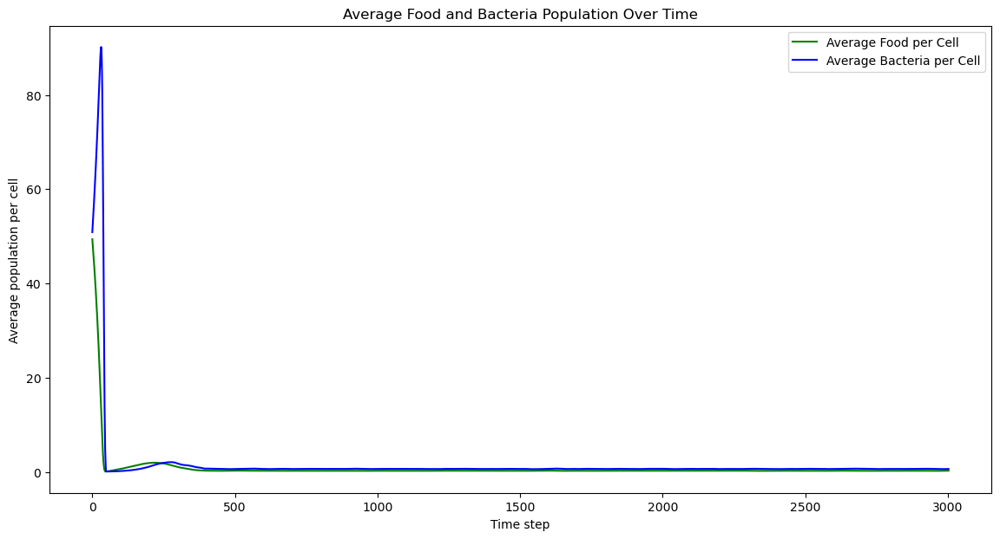

In [10]:
plot_averages(sim)

In [11]:
#Verifying our simulation works as expected by adding assert statements 
#to each of the steps within the update function
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display

class BacteriaSimulator2:
    """
    A class to simulate bacteria and food distribution and dynamics on a 2D grid.

    Attributes:
        grid_size (int): The size of the grid (NxN).
        food_growth_rate (float): Rate at which food grows.
        bacteria_consumption_rate (float): Rate at which bacteria consume food.
        food_diffusion_rate (float): Rate at which food diffuses across the grid.
        bacteria_diffusion_rate (float): Rate at which bacteria diffuse across the grid.
        bacteria_growth_rate (float): Rate at which bacteria grow.
        food_capacity (int): Maximum amount of food per grid cell.
        grid (np.array): The grid storing food and bacteria densities.
        figure (matplotlib.figure.Figure): The figure object for plotting.
        axes (np.array): Array of axes objects for plotting.
        food_plot (matplotlib.image.AxesImage): Plot showing food distribution.
        bacteria_plot (matplotlib.image.AxesImage): Plot showing bacteria distribution.
        average_food_data (list of float): A list to record the average amount of food per cell.
        average_bacteria_data (list of float): A list to record the average bacteria count per cell.
    """

    def __init__(self, grid_size, food_growth_rate, bacteria_consumption_rate, 
                 food_diffusion_rate, bacteria_diffusion_rate, bacteria_growth_rate):
        #Initialize the Bacteria Simulator with given parameters
        self.grid_size = grid_size
        self.food_growth_rate = food_growth_rate
        self.bacteria_consumption_rate = bacteria_consumption_rate
        self.food_diffusion_rate = food_diffusion_rate
        self.bacteria_diffusion_rate = bacteria_diffusion_rate
        self.bacteria_growth_rate = bacteria_growth_rate
        self.food_capacity = 100  # Maximum food per cell
        self.grid = None
        self.figure, self.axes = plt.subplots(1, 2, figsize=(10, 5))
        self.food_plot = None
        self.bacteria_plot = None
        self.average_food_data = []
        self.average_bacteria_data = []
        
    def initialize(self):
        
        """
        Sets up the simulation with initial random food and bacteria distribution and initializes the plots.
        """
    
        self.grid = np.zeros((self.grid_size, self.grid_size, 2))  # [food, bacteria]
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                self.grid[i, j, 0] = np.random.rand() * self.food_capacity
                self.grid[i, j, 1] = np.random.rand() * self.food_capacity
        self.food_plot = self.axes[0].imshow(self.grid[:, :, 0], cmap='viridis')
        self.bacteria_plot = self.axes[1].imshow(self.grid[:, :, 1], vmin=0, vmax=200, cmap='viridis')
        self.axes[0].set_title('Food Distribution')
        self.axes[1].set_title('Bacteria Distribution')
        self.figure.colorbar(self.food_plot, ax=self.axes[0], fraction=0.046, pad=0.04)
        self.figure.colorbar(self.bacteria_plot, ax=self.axes[1], fraction=0.046, pad=0.04)
        
        
    def update(self):
        
        """
        Executes one simulation step, updating food and bacteria distributions according to the model rules.
        """
        new_grid = np.copy(self.grid)
        # Food Growth
        avg_food = np.mean(new_grid[:, :, 0])
        avg_bacteria = np.mean(new_grid[:, :, 1])
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                food = self.grid[i, j, 0]
                food_growth = self.food_growth_rate * food * (1 - food / self.food_capacity)
                new_grid[i, j, 0] = min(food + food_growth, self.food_capacity)
        assert abs(np.mean(new_grid[:, :, 1]) - avg_bacteria) < 0.00000001
        assert np.mean(new_grid[:, :, 0]) >=  avg_food     

        # Food Reseeding
        avg_food = np.mean(new_grid[:, :, 0])
        avg_bacteria = np.mean(new_grid[:, :, 1])
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                if np.random.rand() < 0.01:
                    new_grid[i, j, 0] = min(new_grid[i, j, 0] + 1, self.food_capacity)
        assert abs(np.mean(new_grid[:, :, 1]) - avg_bacteria) < 0.00000001
        assert np.mean(new_grid[:, :, 0]) >=  avg_food 

        # Food Diffusion
        avg_food = np.mean(new_grid[:, :, 0])
        avg_bacteria = np.mean(new_grid[:, :, 1])
        food_diffusion_changes = np.zeros_like(self.grid[:, :, 0])
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                food = new_grid[i, j, 0]
                diffusion_amount = self.food_diffusion_rate * food
                for di, dj in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
                    ni, nj = (i + di) % self.grid_size, (j + dj) % self.grid_size
                    food_diffusion_changes[ni, nj] += diffusion_amount / 4
                food_diffusion_changes[i, j] -= diffusion_amount
        new_grid[:, :, 0] += food_diffusion_changes
        assert abs(np.mean(new_grid[:, :, 1]) - avg_bacteria) < 0.00000001
        assert abs(np.mean(new_grid[:, :, 0]) -  avg_food) < 0.00000001

        # Bacteria Consumption and Reproduction
        avg_food = np.mean(new_grid[:, :, 0])
        avg_bacteria = np.mean(new_grid[:, :, 1])
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                bacteria = self.grid[i, j, 1]
                food = new_grid[i, j, 0]
                if food >= bacteria * self.bacteria_consumption_rate:
                    # Enough food for all bacteria
                    new_grid[i, j, 0] -= bacteria * self.bacteria_consumption_rate
                    new_grid[i, j, 1] *= (1 + self.bacteria_growth_rate)  # Bacteria reproduce
                else:
                    # Not enough food, bacteria starve
                    new_grid[i, j, 1] = (food / self.bacteria_consumption_rate) * (1 + self.bacteria_growth_rate)
                    new_grid[i, j, 0] = 0
        assert np.mean(new_grid[:, :, 0]) <=  avg_food

        # Bacteria Diffusion
        avg_food = np.mean(new_grid[:, :, 0])
        avg_bacteria = np.mean(new_grid[:, :, 1])
        bacteria_diffusion_changes = np.zeros_like(self.grid[:, :, 0])
        for i in range(self.grid_size):
            for j in range(self.grid_size):
                bacteria = new_grid[i, j, 1]
                diffusion_amount = self.bacteria_diffusion_rate * bacteria
                for di, dj in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
                    ni, nj = (i + di) % self.grid_size, (j + dj) % self.grid_size
                    bacteria_diffusion_changes[ni, nj] += diffusion_amount / 4
                bacteria_diffusion_changes[i, j] -= diffusion_amount
        new_grid[:, :, 1] += bacteria_diffusion_changes
        assert abs(np.mean(new_grid[:, :, 1]) - avg_bacteria) < 0.00000001
        assert abs(np.mean(new_grid[:, :, 0]) -  avg_food) < 0.00000001
                
        # Calculate and store the averages
        self.grid = new_grid
        avg_food = np.mean(self.grid[:, :, 0])
        avg_bacteria = np.mean(self.grid[:, :, 1])
        self.average_food_data.append(avg_food)
        self.average_bacteria_data.append(avg_bacteria)
        
def animate(i):
    """
    Animation function that updates the plots for each frame.
    
    Args:
        i (int): The current frame index.
        
    Returns:
        2 plots: Returns the updated food and bacteria plots.
    """
    sim.update()
    sim.food_plot.set_data(sim.grid[:, :, 0])
    sim.bacteria_plot.set_data(sim.grid[:, :, 1])
    return sim.food_plot, sim.bacteria_plot

#Plotting averages
def plot_averages(sim):
    plt.figure(figsize=(14, 7))
    plt.plot(sim.average_food_data, label='Average Food per Cell', color='green')
    plt.plot(sim.average_bacteria_data, label='Average Bacteria per Cell', color='blue')
    plt.xlabel('Time step')
    plt.ylabel('Average population per cell')
    plt.title('Average Food and Bacteria Population Over Time')
    plt.legend()
    plt.show()

In [12]:
#Running a simulation
sim = BacteriaSimulator2(grid_size=100, food_growth_rate=1, bacteria_consumption_rate=0.5, 
                            food_diffusion_rate=0.1, bacteria_diffusion_rate=0.1, bacteria_growth_rate=0.02)
sim.initialize()
anim = FuncAnimation(sim.figure, animate, frames=1000, interval=50, blit=True)
plt.close('all')
display(HTML(anim.to_html5_video()))

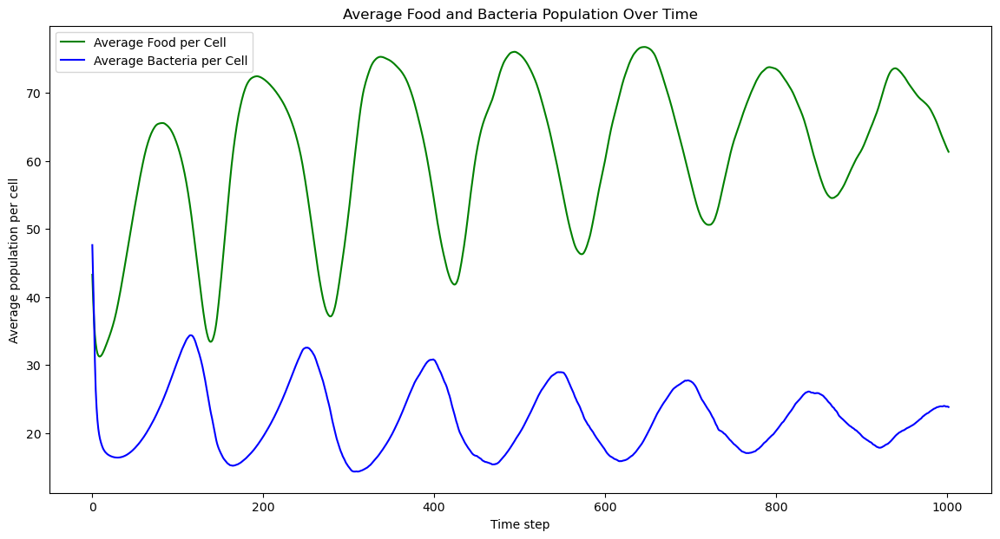

In [13]:
plot_averages(sim)

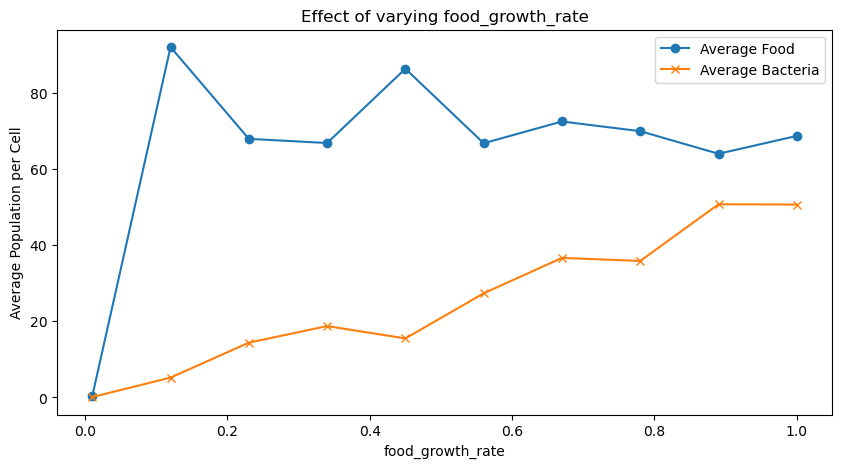

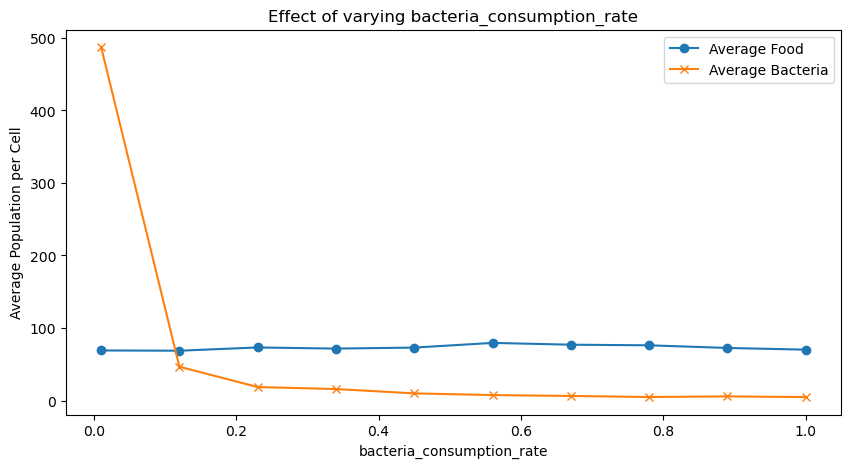

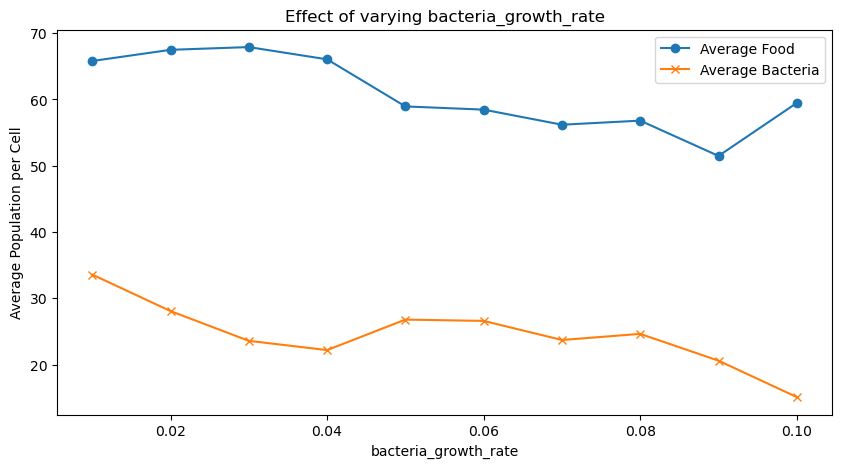

In [17]:
import numpy as np
import matplotlib.pyplot as plt

# Define the average values for all parameters
avg_params = {
    'grid_size': 100,
    'food_growth_rate': 0.5,
    'bacteria_consumption_rate': 0.2,
    'food_diffusion_rate': 0.1,
    'bacteria_diffusion_rate': 0.1,
    'bacteria_growth_rate': 0.02
}

# Define a function to run the simulation and collect average values
def run_simulation(parameter_name, parameter_values):
    avg_food_data = []
    avg_bacteria_data = []
    
    for value in parameter_values:
        # Create a simulator instance with the average parameters
        params = avg_params.copy()
        params[parameter_name] = value  # Change the current parameter
        sim = BacteriaSimulator(**params)
        sim.initialize()

        # Run the simulation for a sufficient number of steps to reach equilibrium
        for _ in range(3000): 
            sim.update()
        
        # Store the average values for food and bacteria
        avg_food_data.append(np.mean(sim.grid[:, :, 0]))
        avg_bacteria_data.append(np.mean(sim.grid[:, :, 1]))
    plt.close("all")
    return avg_food_data, avg_bacteria_data

# Parameters to test
food_growth_rates = np.linspace(0.01, 1, 10)
bacteria_consumption_rates = np.linspace(0.01, 1, 10)
bacteria_growth_rates = np.linspace(0.01, 0.1, 10)

# Run simulations for each parameter and plot the results
for parameter_name, parameter_values in zip(
    ['food_growth_rate', 'bacteria_consumption_rate', 'bacteria_growth_rate'],
    [food_growth_rates, bacteria_consumption_rates, bacteria_growth_rates]):

    avg_food, avg_bacteria = run_simulation(parameter_name, parameter_values)

    plt.figure(figsize=(10, 5))
    plt.plot(parameter_values, avg_food, label='Average Food', marker='o')
    plt.plot(parameter_values, avg_bacteria, label='Average Bacteria', marker='x')
    plt.xlabel(parameter_name)
    plt.ylabel('Average Population per Cell')
    plt.title(f'Effect of varying {parameter_name}')
    plt.legend()
    plt.show()
